In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [2]:
import matplotlib.pyplot as plt

In [3]:
import seaborn as sns

In [4]:
df = pd.read_csv('part_10.csv')
df.shape

(57845, 8)

In [5]:
df.loc[df['CLIENT_IP'].isnull()]

,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,MATCHED_VARIABLE_VALUE,EVENT_ID
31235,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31747,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47187,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50650,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53668,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
57452,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
df.loc[df.MATCHED_VARIABLE_SRC.isnull()==True]

,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,MATCHED_VARIABLE_VALUE,EVENT_ID
50,"> -gOxT""O<Ghèe]Ø È8 G`Qf¾ñ }y ðù!T...",SQL Injection,AVdYz8-Wq1Ppo9zF0mzK,2f53b17df6da6bf9aeec27b0d87413c4,NaN,NaN,NaN,NaN
162,Remote Code Execution,AVdtgf8uq1Ppo9zF_hyd,4df2f46285c84ba39fa84fc4878214ae,NaN,NaN,NaN,NaN,NaN
1308,"~@.*"")ۅ",SQL Injection,AVdsla-3q1Ppo9zF_J7c,dd7ff149a6270e8037f6aa280b4ca1bd,NaN,NaN,NaN,NaN
1894,Remote Code Execution,AVddr1QQq1Ppo9zF3Vuj,0b168993dda4ce786f3455d01e162a58,NaN,NaN,NaN,NaN,NaN
1922,Ä}jSL 0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
55816,>ݢÕ òæ%lߟÓ 3ÿ,SQL Injection,AVdhXrMsq1Ppo9zF5F_k,7ccc451ad8a2981f1e6f7eb6a5813246,NaN,NaN,NaN,NaN
55854,Remote Code Execution,AVdcPTKlq1Ppo9zF2cLI,8a20b39944200f5a3bc37a1fdfb21a73,NaN,NaN,NaN,NaN,NaN
55871,ÕBÿ,AVddkIdNq1Ppo9zF3QzL,NaN,NaN,NaN,NaN,NaN,NaN
55896,Remote Code Execution,AVdcvSoAq1Ppo9zF2y_z,1cc6e2fe3fcc728c132e90c43d6b787d,NaN,NaN,NaN,NaN,NaN


In [7]:
df.dropna(how='all', axis=0,inplace=True)
df.reset_index(inplace=True)
df.rename(columns={'index':'orig_orig_idx'},inplace=True)
df.shape

(57838, 9)

In [8]:
df.drop_duplicates(inplace=True)
df.shape

(57838, 9)

In [9]:
cols_describe = [df[df.columns[i]].describe() for i in range(len(df.columns))]
print(*cols_describe, sep='\n'*3)

count    57838.000000
mean     28920.100124
std      16698.337246
min          0.000000
25%      14459.250000
50%      28918.500000
75%      43380.750000
max      57844.000000
Name: orig_orig_idx, dtype: float64


count              57838
unique             24940
top       217.175.140.69
freq               11286
Name: CLIENT_IP, dtype: object


count                                                 57517
unique                                                 6992
top       Mozilla/5.0 (Windows NT 6.1; WOW64; Trident/7....
freq                                                   2117
Name: CLIENT_USERAGENT, dtype: object


count     57794
unique     5758
top         259
freq        261
Name: REQUEST_SIZE, dtype: object


count     57770
unique       60
top         200
freq      25771
Name: RESPONSE_CODE, dtype: object


count                57730
unique                  21
top       REQUEST_GET_ARGS
freq                 20812
Name: MATCHED_VARIABLE_SRC, dtype: object


count               

In [328]:
# можно попробовать доп признак:
df['CLIENT_USERAGENT'].str.contains('bot').value_counts()
# UPD: признак не принес особого прироста

False    52860
True      4657
Name: CLIENT_USERAGENT, dtype: int64

In [15]:
df.MATCHED_VARIABLE_VALUE.str.contains('xmlrpc').value_counts()
#df.loc[df.MATCHED_VARIABLE_VALUE.str.contains('xmlrpc')==True]

False    57682
True         1
Name: MATCHED_VARIABLE_VALUE, dtype: int64

In [16]:
# попробуем доп признак:
#df['Bot_or_not'] = df['CLIENT_USERAGENT'].apply(lambda x: 1 if ('bot' in str(x)) else 0)

In [17]:
#df.Bot_or_not.value_counts()

In [18]:
df.RESPONSE_CODE.value_counts()

200                                 25771
404                                 20367
302                                  6630
403                                  1156
304                                   940
504                                   700
301                                   584
502                                   558
500                                   318
400                                   212
204                                   116
206                                    90
307                                    74
405                                    63
503                                    62
401                                    46
303                                    37
207                                     4
8db0d594d4b89f35dbedc593c724c29b        1
dcbfc5eef493e919119fd48eb4f957ad        1
fc59a2c72afacddb8f8492c3c065b0e0        1
d64bdad286ae021642535d4f119a0546        1
01bfebabb27b66e033b76a34951b41cb        1
b09268bd2d762c0a2b222c2575c658ba  

In [20]:
#response_codes_ok = [226,431,451,510,511, list(range(100,104)), list(range(200,209)), list(range(300,309)), list(range(400,419)), list(range(421,430)), list(range(500,509))]

In [21]:
def flat_list(lst):
    res = []
    for sub in lst:
        if isinstance(sub, list):
            res.extend(flat_list(sub))
        else:
            res.append(str(sub))
    return res

In [330]:
# слишком много уникальных + айдишники чаще всего бесполезныб попробуем удалить UPD: не удаляем
cols2drop = ['MATCHED_VARIABLE_VALUE','EVENT_ID']
#response_codes_ok = flat_list(response_codes_ok)



In [144]:
df.columns

Index(['orig_orig_idx', 'CLIENT_IP', 'CLIENT_USERAGENT', 'REQUEST_SIZE',
       'RESPONSE_CODE', 'MATCHED_VARIABLE_SRC', 'MATCHED_VARIABLE_NAME',
       'MATCHED_VARIABLE_VALUE', 'EVENT_ID'],
      dtype='object')

In [158]:
df_clean = df.drop(cols2drop, axis=1)
#df_clean = df_clean.loc[df_clean.RESPONSE_CODE.isin(response_codes_ok)]
print(df_clean.shape)
df_clean.sample(3)

(57838, 7)


,orig_orig_idx,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME
39046,39048,192.168.100.63,Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKi...,858,200,REQUEST_JSON,.[1]
31556,31557,188.43.52.163,curl/7.22.0 (i686-pc-linux-gnu) libcurl/7.22.0...,146580,200,REQUEST_POST_ARGS,ò¢
12042,12042,95.26.84.47,Mozilla/4.0 (compatible; MSIE 8.0; Windows NT ...,2853,200,REQUEST_POST_ARGS,1


In [159]:
df_clean.orig_orig_idx.max()

57844

In [164]:
# preprocessing

In [165]:
df_clean[df_clean['REQUEST_SIZE'].isna()]

,orig_orig_idx,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME
1922,1922,Ä}jSL 0,NaN,NaN,NaN,NaN,NaN
1923,1923,րÿ,AVdo4TiJq1Ppo9zF9OU0,NaN,NaN,NaN,NaN
3231,3231,M{5¯ۯXµ #©نFî>R·8çp QÌû¿¼G̓X¿,NaN,NaN,NaN,NaN,NaN
3671,3671,¸#ØÓ,NaN,NaN,NaN,NaN,NaN
4144,4144,f~|°ØÀ¶ g8%ú·P:V­,NaN,NaN,NaN,NaN,NaN
5874,5874,ß9oöqÎ,AVdg3Qg9q1Ppo9zF4x8p,NaN,NaN,NaN,NaN
7664,7664,¾_ı-#zÌbϰlôîÙ$õÁø¦ÎÚÞæÖPmÞh r@鸆ý...,NaN,NaN,NaN,NaN,NaN
9440,9440,Uû齗$íç¨ùN,NaN,NaN,NaN,NaN,NaN
9461,9461,¿Jwþ! áFÁ霯N£֬¼ERÚ3¤9ÏDbüù¦Cû©ʱF 6ÿ,AVdZx2MFq1Ppo9zF1IGo,NaN,NaN,NaN,NaN
11506,11506,¿b_,NaN,NaN,NaN,NaN,NaN


In [166]:
#df_clean['REQUEST_SIZE'].fillna(0.0,inplace=True)


In [167]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

df_clean['REQUEST_SIZE'] = pd.to_numeric(df_clean['REQUEST_SIZE'], errors='coerce')
df_clean['RESPONSE_CODE'] = pd.to_numeric(df_clean['RESPONSE_CODE'], errors='coerce')
# только после заменять NaN значения, тк errors='coerce' их снова создаст
df_clean['REQUEST_SIZE'] = df_clean['REQUEST_SIZE'].fillna(0)
df_clean['RESPONSE_CODE'] = df_clean['RESPONSE_CODE'].fillna(0)


#df_clean = df_clean.dropna(subset=['REQUEST_SIZE', 'RESPONSE_CODE'])

print(df_clean.shape)

df_clean.head(2)

(57838, 7)


,orig_orig_idx,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME
0,0,188.138.92.55,NaN,166.0,404.0,REQUEST_URI,NaN
1,1,93.158.215.131,Mozilla/5.0 (Windows NT 6.3; WOW64; rv:45.0) G...,431.0,302.0,REQUEST_GET_ARGS,url


In [168]:
df_clean[df_clean['REQUEST_SIZE'].isna()]

,orig_orig_idx,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME


In [169]:

df_clean['CLIENT_USERAGENT'].fillna('Unknown', inplace=True)
df_clean['MATCHED_VARIABLE_NAME'].fillna('NonDefined', inplace=True)
df_clean['MATCHED_VARIABLE_SRC'].fillna('NonDefined', inplace=True)

In [170]:
userag_list=[''.join(i.split()) for i in df_clean['CLIENT_USERAGENT'].values.tolist()]
userag_list[:2]

['Unknown',
 'Mozilla/5.0(WindowsNT6.3;WOW64;rv:45.0)Gecko/20100101Firefox/45.0']

In [171]:
df_clean['CLIENT_USERAGENT'] = userag_list
df_clean['CLIENT_USERAGENT'][:2]

0                                              Unknown
1    Mozilla/5.0(WindowsNT6.3;WOW64;rv:45.0)Gecko/2...
Name: CLIENT_USERAGENT, dtype: object

In [172]:
df_clean['CLIENT_USERAGENT'] = df_clean['CLIENT_USERAGENT'].str.replace(r'[^a-zA-Z0-9]+','')
df_clean.head(2)

,orig_orig_idx,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME
0,0,188.138.92.55,Unknown,166.0,404.0,REQUEST_URI,NonDefined
1,1,93.158.215.131,Mozilla50WindowsNT63WOW64rv450Gecko20100101Fir...,431.0,302.0,REQUEST_GET_ARGS,url


In [173]:
le = LabelEncoder()
df_clean['CLIENT_USERAGENT'] = le.fit_transform(df_clean['CLIENT_USERAGENT'])
df_clean.head(2)

,orig_orig_idx,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME
0,0,188.138.92.55,6727,166.0,404.0,REQUEST_URI,NonDefined
1,1,93.158.215.131,5756,431.0,302.0,REQUEST_GET_ARGS,url


In [174]:
scaler1 = StandardScaler()
df_clean[['REQUEST_SIZE','RESPONSE_CODE']] = scaler1.fit_transform(df_clean[['REQUEST_SIZE', 'RESPONSE_CODE']])

In [175]:
userag_list2=[''.join(i.split()) for i in df_clean['MATCHED_VARIABLE_SRC'].values.tolist()]
df_clean['MATCHED_VARIABLE_SRC'] = userag_list2
df_clean['MATCHED_VARIABLE_SRC'] = df_clean['MATCHED_VARIABLE_SRC'].str.replace(r'[^a-zA-Z0-9]+','')
df_clean['MATCHED_VARIABLE_SRC'] = le.fit_transform(df_clean['MATCHED_VARIABLE_SRC'])

In [176]:
userag_list3=[''.join(i.split()) for i in df_clean['MATCHED_VARIABLE_NAME'].values.tolist()]
df_clean['MATCHED_VARIABLE_NAME'] = userag_list3
df_clean['MATCHED_VARIABLE_NAME'] = df_clean['MATCHED_VARIABLE_NAME'].str.replace(r'[^a-zA-Z0-9]+','')
df_clean['MATCHED_VARIABLE_NAME'] = le.fit_transform(df_clean['MATCHED_VARIABLE_NAME'])

In [177]:
df_clean.head(2)

,orig_orig_idx,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME
0,0,188.138.92.55,6727,-0.050076,1.047074,17,505
1,1,93.158.215.131,5756,-0.047717,0.021842,9,3018


In [178]:
scaler2 = StandardScaler()
df_clean[['CLIENT_USERAGENT','MATCHED_VARIABLE_SRC','MATCHED_VARIABLE_NAME']] = scaler2.fit_transform(df_clean[['CLIENT_USERAGENT','MATCHED_VARIABLE_SRC','MATCHED_VARIABLE_NAME']])

In [179]:
df_clean.head(2)

,orig_orig_idx,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME
0,0,188.138.92.55,1.099850,-0.050076,1.047074,1.402860,-1.233779
1,1,93.158.215.131,0.575211,-0.047717,0.021842,-0.382624,2.713576


In [180]:
import ipaddress

def ip_to_int(ip):
    try:
        ip_version = ipaddress.ip_address(ip).version
        if ip_version == 4:  # IPv4
            return int(ipaddress.IPv4Address(ip))
        elif ip_version == 6:  # IPv6
            return int(ipaddress.IPv6Address(ip))
    except ValueError:
        return None  
        
df_clean['CLIENT_IP_INT'] = df_clean['CLIENT_IP'].apply(ip_to_int)
df_clean.head(2)

,orig_orig_idx,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,CLIENT_IP_INT
0,0,188.138.92.55,1.099850,-0.050076,1.047074,1.402860,-1.233779,3.163184e+09
1,1,93.158.215.131,0.575211,-0.047717,0.021842,-0.382624,2.713576,1.570691e+09


In [181]:
df_clean.loc[df_clean['CLIENT_IP_INT'].isna()]

,orig_orig_idx,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,CLIENT_IP_INT
50,50,"> -gOxT""O<Ghèe]Ø È8 G`Qf¾ñ }y ðù!T...",1.083101,-0.051554,-3.013649,-1.721736,-1.233779,NaN
162,162,Remote Code Execution,-2.475909,-0.051554,-3.013649,-1.721736,-1.233779,NaN
590,590,2a01:598:9902:df0c:8115:691e:c38,1.008538,-0.040230,0.041944,-0.828994,2.063275,NaN
1308,1308,"~@.*"")ۅ",1.083101,-0.051554,-3.013649,-1.721736,-1.233779,NaN
1894,1894,Remote Code Execution,-2.486715,-0.051554,-3.013649,-1.721736,-1.233779,NaN
...,...,...,...,...,...,...,...,...
55848,55854,Remote Code Execution,-2.492118,-0.051554,-3.013649,-1.721736,-1.233779,NaN
55865,55871,ÕBÿ,-2.487255,-0.051554,-3.013649,-1.721736,-1.233779,NaN
55890,55896,Remote Code Execution,-2.489416,-0.051554,-3.013649,-1.721736,-1.233779,NaN
56852,56858,2a00:1148:b0ba:2615:8b4:f98f:f56,-0.227146,-0.044325,-1.003390,1.402860,-1.233779,NaN


In [182]:
df_clean_train = df_clean.copy(deep=True)
df_clean_train.head(1)


,orig_orig_idx,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,CLIENT_IP_INT
0,0,188.138.92.55,1.09985,-0.050076,1.047074,1.40286,-1.233779,3.163184e+09


In [183]:
df_clean_train.drop(['CLIENT_IP','orig_orig_idx'], axis=1, inplace=True)
df_clean_train.head(1)

,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,CLIENT_IP_INT
0,1.09985,-0.050076,1.047074,1.40286,-1.233779,3.163184e+09


In [184]:
print('Unique values after preprocessing:\n')
print(*(zip(df_clean_train.columns,
            [df_clean_train[df_clean_train.columns[i]].nunique() for i in range(len(df_clean_train.columns))])), sep='\n')

Unique values after preprocessing:

('CLIENT_USERAGENT', 6952)
('REQUEST_SIZE', 5695)
('RESPONSE_CODE', 20)
('MATCHED_VARIABLE_SRC', 22)
('MATCHED_VARIABLE_NAME', 3131)
('CLIENT_IP_INT', 24822)


In [185]:
df_clean_train.columns

Index(['CLIENT_USERAGENT', 'REQUEST_SIZE', 'RESPONSE_CODE',
       'MATCHED_VARIABLE_SRC', 'MATCHED_VARIABLE_NAME', 'CLIENT_IP_INT'],
      dtype='object')

In [186]:
df_clean_train['CLIENT_IP_INT'].fillna(0.0,inplace=True) 
scaler3 = StandardScaler()
df_clean_train['CLIENT_IP_INT'] = scaler3.fit_transform(df_clean_train[['CLIENT_IP_INT']])
#df_clean_train.dropna(subset=['CLIENT_IP_INT'], inplace=True)# = 
df_clean_train['CLIENT_IP_INT'].fillna(0,inplace=True)

In [187]:
df_clean_train.loc[df_clean_train['REQUEST_SIZE'].isna()]

,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,CLIENT_IP_INT


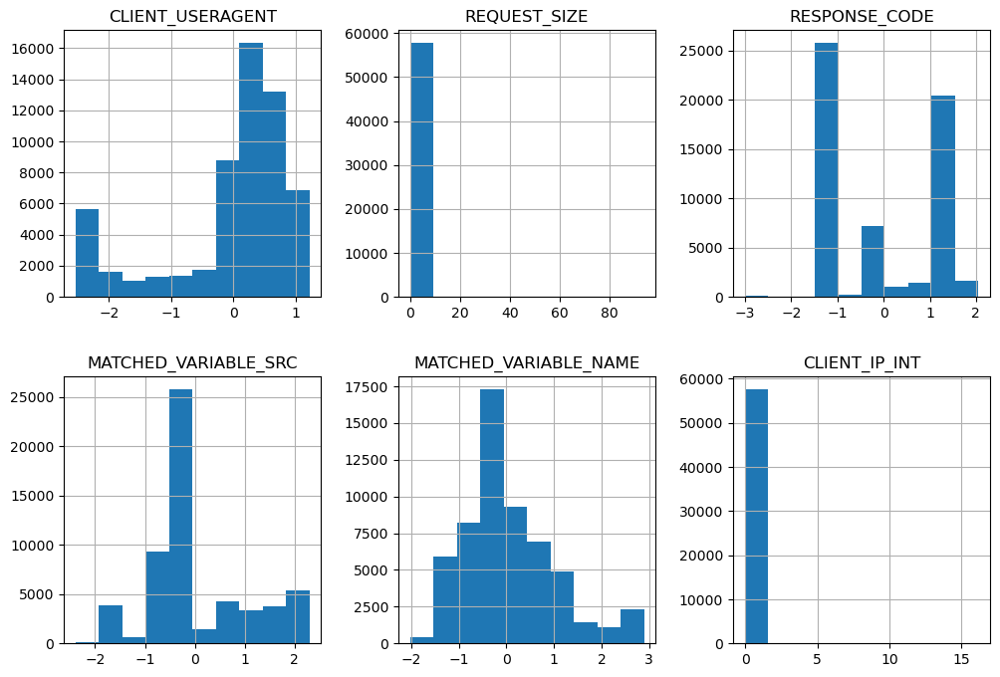

In [188]:
df_clean_train.hist(figsize=(12,8), layout=(-1,3));

### Кластеризация

In [189]:
from sklearn.cluster import DBSCAN

In [301]:
#df.CLIENT_IP.value_counts()[-40:]

213.221.9.197      1
193.33.233.254     1
193.106.163.38     1
31.162.253.2       1
93.120.163.49      1
178.66.238.250     1
5.141.126.222      1
5.59.130.142       1
80.83.239.55       1
37.29.41.59        1
93.190.20.18       1
95.106.107.148     1
92.101.100.163     1
5.187.82.4         1
84.244.13.111      1
128.72.133.172     1
46.188.127.5       1
178.176.112.131    1
119.198.121.3      1
158.181.194.43     1
54.36.150.68       1
109.173.22.177     1
51.255.162.165     1
212.96.196.22      1
83.220.236.166     1
94.233.225.86      1
78.155.173.9       1
217.66.158.233     1
185.79.100.72      1
213.21.42.33       1
92.126.151.226     1
5.228.38.186       1
188.170.80.148     1
94.233.225.71      1
31.132.173.93      1
85.26.232.159      1
188.162.192.161    1
178.70.94.21       1
168.235.196.230    1
89.23.32.19        1
Name: CLIENT_IP, dtype: int64

In [302]:
#print(df_clean_train.CLIENT_IP_INT.value_counts())

-0.066916     57576
 12.318001       96
 16.188764       53
 16.187258       32
 16.187258       13
 16.187258       11
 16.190683       10
 16.187258        8
 16.192779        7
 16.187258        6
 16.187159        4
 16.188780        3
 16.187258        2
 16.190692        2
 16.190907        2
 16.188773        1
 12.317943        1
 12.317943        1
 16.188938        1
 16.186838        1
 14.649865        1
 12.317943        1
 16.189886        1
 16.188780        1
 12.317597        1
 16.188975        1
 16.188784        1
 16.187258        1
Name: CLIENT_IP_INT, dtype: int64


In [313]:
# взяла  min_samples=19, тк, думаю, фича с ip адресами будет играть большую роль, а у нас от 18 ip, 
# которые выглядят явно отличающимися ото всех ост
dbscan = DBSCAN(eps=0.5, min_samples=18)
clustering = dbscan.fit(df_clean_train)

In [314]:
cluster_labels = clustering.labels_
cluster_labels

array([0, 1, 2, ..., 2, 5, 5], dtype=int64)

In [319]:
df_clean_train['Cluster_Label_dbscan'] = cluster_labels
df_clean_train.head(2)

,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,CLIENT_IP_INT,Cluster_Label_dbscan
0,1.099850,-0.050076,1.047074,1.402860,-1.233779,-0.066916,0
1,0.575211,-0.047717,0.021842,-0.382624,2.713576,-0.066916,1


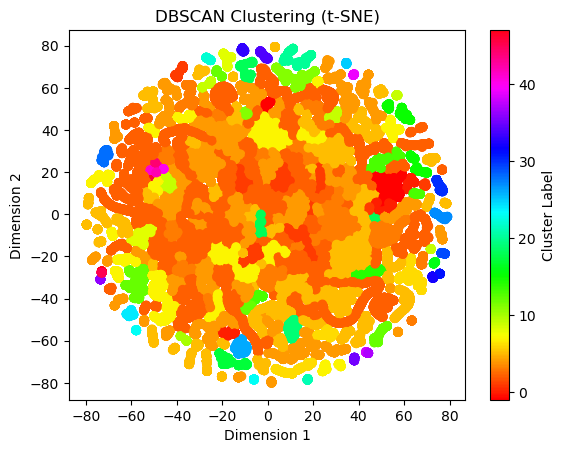

In [327]:
#new 
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2)
data_reduced = tsne.fit_transform(df_clean_train)

plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=cluster_labels, cmap='hsv')
plt.title('DBSCAN Clustering (t-SNE)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.colorbar(label='Cluster Label')
plt.show()

In [315]:
cluster_labels.max(), cluster_labels.min()

(47, -1)

In [316]:
n_clusters_ = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
n_clusters_

48

In [332]:
from joblib import dump
dump(dbscan, 'dbscan_orig_model.joblib')

['dbscan_orig_model.joblib']

In [221]:
import plotly.express as px

In [310]:
fig = px.scatter_3d(df_clean_train, x='CLIENT_IP_INT', y='RESPONSE_CODE', z='MATCHED_VARIABLE_NAME', color='Cluster_Label_dbscan')
fig.update_traces(marker=dict(size=3))
fig.show()

In [81]:
# идея поделить на октеты отдельно, чтобы не делать нормировку по всему адресу, а взять как отдельные признаки каждый октет. Что делать тогда с ipv6?
# %%time
# ip_df = df[['CLIENT_IP']][:10]
# ip_df.head()
# def ip_to_octs(x):
#     octets = str(x).split('.')
#     #print(octets)
#     if len(octets)==4:
#         ip_df['oct1'] = octets[0]
#         ip_df['oct2'] = octets[1]
#         ip_df['oct3'] = octets[2]
#         ip_df['oct4'] = octets[3]
# #ip_df['oct1','oct2','oct3','oct4'] = ip_df.CLIENT_IP[:10].parallel_apply(ip_to_octs)
# ip_df['oct1'] = ip_df.CLIENT_IP[:10].apply(lambda x: str(x).split('.')[0])
# ip_df['oct2'] = ip_df.CLIENT_IP[:10].apply(lambda x: str(x).split('.')[1])
# ip_df['oct3'] = ip_df.CLIENT_IP[:10].apply(lambda x: str(x).split('.')[2])
# ip_df['oct4'] = ip_df.CLIENT_IP[:10].apply(lambda x: str(x).split('.')[3])
# ip_df.head()

Wall time: 3.99 ms


,CLIENT_IP,oct1,oct2,oct3,oct4
0,188.138.92.55,188,138,92,55
1,93.158.215.131,93,158,215,131
2,176.123.240.64,176,123,240,64
3,73.78.81.63,73,78,81,63
4,66.102.9.44,66,102,9,44


In [195]:
df_clean_train.shape, df_clean.shape

((57838, 7), (57838, 8))

In [196]:
df_clean.head()

,orig_orig_idx,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,CLIENT_IP_INT
0,0,188.138.92.55,1.099850,-0.050076,1.047074,1.402860,-1.233779,3.163184e+09
1,1,93.158.215.131,0.575211,-0.047717,0.021842,-0.382624,2.713576,1.570691e+09
2,2,176.123.240.64,0.106224,-0.048037,1.037022,0.733304,-1.233779,2.960912e+09
3,3,73.78.81.63,0.575211,-0.048109,0.021842,-0.382624,2.713576,1.229869e+09
4,4,66.102.9.44,-1.826458,-0.036127,1.047074,-0.382624,-0.497086,1.113983e+09


In [320]:
df['orig_orig_idx'].equals(df_clean['orig_orig_idx'])

True

In [321]:
df_result = pd.concat([ df['orig_orig_idx'], df_clean_train['Cluster_Label_dbscan']], axis=1) #df_clean['orig_orig_idx']
df_result.head()

,orig_orig_idx,Cluster_Label_dbscan
0,0,0
1,1,1
2,2,2
3,3,1
4,4,2


In [322]:
df.index.max(), len(df)

(57837, 57838)

In [323]:
df.tail(2)

,orig_orig_idx,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,MATCHED_VARIABLE_VALUE,EVENT_ID
57836,57843,194.228.20.50,Mozilla/5.0 (Windows NT 6.1; WOW64; Trident/7....,1550,200,REQUEST_POST_ARGS,REQUEST_POST_ARGS.s_Unids,688D71625B88803CC125818E00471A8D;9915FD3520134...,OsTJ_mMBjksgoq1e2QnM
57837,57844,188.43.52.163,curl/7.22.0 (i686-pc-linux-gnu) libcurl/7.22.0...,95832,200,REQUEST_ARGS_KEYS,XâO½#*« WÒ:©¹µMÖ\täÛk17qòmʂ3³vާÏ?æÞÅË...,XâO½#*« WÒ:©¹µMÖ\täÛk17qòmʂ3³vާÏ?æÞÅË...,AVdrtwAxq1Ppo9zF-v1_


In [324]:
# [57838, 57839, 57840, 57841, 57842, 57843, 57844]
# нужно взять из df который уже с пересчитанным индексом до 57837 те строки у кот ориинальный индекс соответствует orig из df_result
#df.loc[df['orig_orig_idx'] == df_result['orig_orig_idx']]

In [331]:
df_result.columns

Index(['CLIENT_IP', 'CLIENT_USERAGENT', 'REQUEST_SIZE', 'RESPONSE_CODE',
       'MATCHED_VARIABLE_SRC', 'MATCHED_VARIABLE_NAME',
       'MATCHED_VARIABLE_VALUE', 'EVENT_ID', 'Cluster_Label_dbscan'],
      dtype='object')

In [325]:
#df_result = pd.concat([df_result, df.iloc[df_result['orig_orig_idx']]],axis=1)
df_result = pd.concat([df_result, df.loc[df['orig_orig_idx'] == df_result['orig_orig_idx']]],axis=1)

df_result = df_result[['CLIENT_IP','CLIENT_USERAGENT','REQUEST_SIZE', 'RESPONSE_CODE', 'MATCHED_VARIABLE_SRC','MATCHED_VARIABLE_NAME', 'MATCHED_VARIABLE_VALUE', 'EVENT_ID', 'Cluster_Label_dbscan']]
df_result.head()

,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,MATCHED_VARIABLE_VALUE,EVENT_ID,Cluster_Label_dbscan
0,188.138.92.55,NaN,166,404,REQUEST_URI,NaN,//tmp/20160925122692indo.php.vob,AVdhXFgVq1Ppo9zF5Fxu,0
1,93.158.215.131,Mozilla/5.0 (Windows NT 6.3; WOW64; rv:45.0) G...,431,302,REQUEST_GET_ARGS,url,http://www.galitsios.gr/?option=com_k2,AVdcJmIIq1Ppo9zF2YIp,1
2,176.123.240.64,Mozilla/5.0 (Windows NT 6.0; rv:34.0) Gecko/20...,395,403,REQUEST_PATH,NaN,"/opinion/page1_3.php\"" and \""\""x\""\""=\""\""x\""",iz7SN2YBrgKk_RFNZW_U,2
3,73.78.81.63,Mozilla/5.0 (Windows NT 6.3; WOW64; rv:45.0) G...,387,302,REQUEST_GET_ARGS,url,http://thereviewgroup.org/boss-capital/,AVdjekw4q1Ppo9zF6QT2,1
4,66.102.9.44,Mozilla/5.0 (Linux; Android 4.4.2; GT-N7100 Bu...,1733,404,REQUEST_GET_ARGS,REQUEST_GET_ARGS._,1516288084140,SqQGI2QB5cBXmMW1CDbp,2


In [326]:
df_result.to_csv('result_data.csv', index_label='original_idx')

### проверка алгоритмов

In [211]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

In [317]:
# better higher
silhouette_score(df_clean_train,cluster_labels)

0.42346204075610405

In [318]:
# better lower
davies_bouldin_score(df_clean_train,cluster_labels)

1.9595135391887777

In [ ]:
42 1.95

In [234]:
import hdbscan
hdbscan = hdbscan.HDBSCAN(min_cluster_size=50, allow_single_cluster=True)

clusters_hdbscan = hdbscan.fit_predict(df_clean_train)
clusters_hdbscan.max(), clusters_hdbscan.min()

(300, -1)

In [235]:
silhouette_hdbscan = silhouette_score(df_clean_train, clusters_hdbscan)
davies_bouldin_hdbscan = davies_bouldin_score(df_clean_train, clusters_hdbscan)
silhouette_hdbscan, davies_bouldin_hdbscan

(0.33104805681323257, 1.5214919667455855)

In [292]:
from sklearn.cluster import KMeans
X = df_clean_train.values
kmeans = KMeans(n_clusters=47) # 47
kmeans.fit(X)
clusters_kmeans = kmeans.predict(X)
print(kmeans.n_clusters)

47


In [293]:
kmeans.n_features_in_

7

In [294]:
silhouette_kmeans = silhouette_score(X, clusters_kmeans)
davies_bouldin_kmeans = davies_bouldin_score(X, clusters_kmeans)
silhouette_kmeans, davies_bouldin_kmeans

(0.5430557702191515, 0.6560479387252351)

In [291]:
#49 clusters: 53 62
# 46: 53 62
# 47: 54 65 -> best
# 48: 52 65


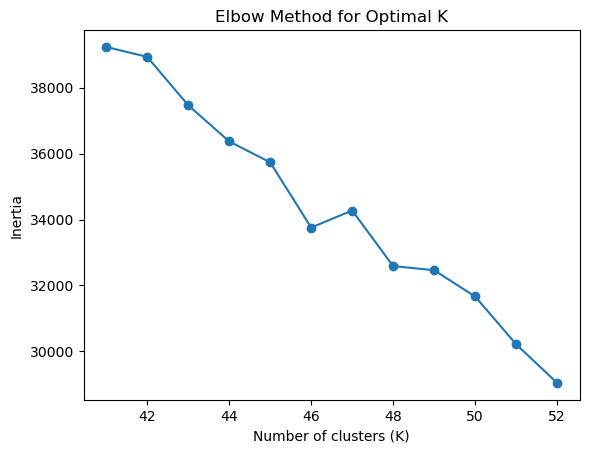

In [219]:
# этот метод мб не совсем хорош,тк классов довольно много и данные в них не распределены равномерно
inertia_values = []
k_values = range(41, 53) 

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    inertia_values.append(kmeans.inertia_)

plt.plot(k_values, inertia_values, marker='o')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.show()

# Итог: 47 кластеров для KMeans и 47-48 для DBSCAN (min_samples=15-20)